In [33]:
import tensorflow as tf
import glob
from matplotlib import pyplot as plt
%matplotlib inline

In [63]:
!pip install tensorflow_addons

In [64]:
import tensorflow_addons as tfa

D:\tenserflow\miniconda\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.7.0 and strictly below 2.10.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.6.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


In [34]:
imgs_A = glob.glob('datasets/face/man/*.jpg')

In [35]:
len(imgs_A)

764

In [36]:
imgs_B = glob.glob('datasets/face/woman/*.jpg')

In [37]:
len(imgs_B)

760

In [38]:
test_A = glob.glob('datasets/face/man_test/*.jpg')
test_B = glob.glob('datasets/face/woman_test/*.jpg')

In [39]:
len(test_A), len(test_B)

(233, 204)

In [40]:
def read_jpg(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img

In [41]:
def normalize(input_image):
    input_image = tf.cast(input_image, tf.float32)/127.5 - 1
    return input_image

In [42]:
def load_image(image_path):
    image = read_jpg(image_path)
    image = tf.image.resize(image, (256, 256))
    image = normalize(image)
    return image

In [43]:
train_a = tf.data.Dataset.from_tensor_slices(imgs_A)
train_b = tf.data.Dataset.from_tensor_slices(imgs_B)
test_a = tf.data.Dataset.from_tensor_slices(test_A)
test_b = tf.data.Dataset.from_tensor_slices(test_B)

In [44]:
BUFFER_SIZE = 200
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [45]:
train_a = train_a.map(load_image, 
                      num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(1)
train_b = train_b.map(load_image, 
                      num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(1)
test_a = test_a.map(load_image, 
                      num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(1)
test_b = test_b.map(load_image, 
                      num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(1)


In [46]:
data_train = tf.data.Dataset.zip((train_a, train_b))
data_test = tf.data.Dataset.zip((test_a, test_b))

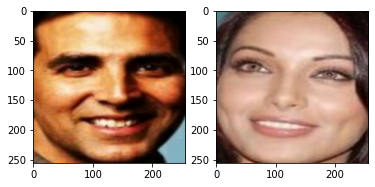

In [47]:
plt.figure(figsize=(6, 3))
for img, mask in zip(train_a.take(1), train_b.take(1)):
    plt.subplot(1,2,1)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(img[0]))
    plt.subplot(1,2,2)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(mask[0]))

In [68]:
def downsample(filters, size, apply_norm=True):
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                               use_bias=False))
    if apply_norm:
        model.add(tfa.layers.InstanceNormalization())
        
    model.add(tf.keras.layers.LeakyReLU())
    return model

In [69]:
def upsample(filters, size, apply_dropout=False):

    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                        padding='same',use_bias=False))
    model.add(tfa.layers.InstanceNormalization())
    if apply_dropout:
        model.add(tf.keras.layers.Dropout(0.5))

    model.add(tf.keras.layers.ReLU())
    return model

In [70]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256,256,3])

    down_stack = [
        downsample(64, 4, apply_norm=False), # (128, 128, 64)
        downsample(128, 4), # (64, 64, 128)
        downsample(256, 4), # (32, 32, 256)
        downsample(512, 4), # (16, 16, 512)
        downsample(512, 4), # (8, 8, 512)
        downsample(512, 4), # (4, 4, 512)
        downsample(512, 4), # (2, 2, 512)
        downsample(512, 4), # (1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), # (2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (8, 8, 1024)
        upsample(512, 4), # (16, 16, 1024)
        upsample(256, 4), # (32, 32, 512)
        upsample(128, 4), # (64, 64, 256)
        upsample(64, 4), # (128, 128, 128)
    ]

    last = tf.keras.layers.Conv2DTranspose(3, 4,strides=2,
                                         padding='same',activation='tanh') # (256, 256, 3)

    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsample and skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.concatenate([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [71]:
generator_x = Generator()   # a2b
generator_y = Generator()   # b2a

In [72]:
def Discriminator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')

    down1 = downsample(64, 4, False)(inputs) # (128, 128, 64)
    down2 = downsample(128, 4)(down1) # (64, 64, 128)
    down3 = downsample(256, 4)(down2) # (32, 32, 256)

    x = tfa.layers.InstanceNormalization()(down3)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Conv2D(
               1, 3, strides=1)(x)  # (30, 30, 1)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [73]:
discriminator_x = Discriminator()   # discriminator  a
discriminator_y = Discriminator()   # discriminator  o

In [74]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [75]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    disc_loss = real_loss + generated_loss
    return disc_loss

In [76]:
def generator_loss(disc_generated_output):
    gen_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    return gen_loss

In [77]:
LAMBDA = 7

In [78]:
def calc_cycle_loss(real_image, cycled_image):
    cycle_loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * cycle_loss

In [79]:
generator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [80]:
def generate_images(model, test_input):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], prediction[0]]
    title = ['Input Image', 'Predicted Image']

    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

In [81]:
@tf.function
def train_step(image_a, image_b):
    with tf.GradientTape(persistent=True) as tape:
        fake_b = generator_x(image_a, training=True)
        cycled_a = generator_y(fake_b, training=True)

        fake_a = generator_y(image_b, training=True)
        cycled_b = generator_x(fake_a, training=True)
        
        disc_real_a = discriminator_x(image_a, training=True)
        disc_real_b = discriminator_y(image_b, training=True)

        disc_fake_a = discriminator_x(fake_a, training=True)
        disc_fake_b = discriminator_y(fake_b, training=True)
        
        #loss
        gen_x_loss = generator_loss(disc_fake_b)
        gen_y_loss = generator_loss(disc_fake_a)
    
        total_cycle_loss = (calc_cycle_loss(image_a, cycled_a) 
                               + calc_cycle_loss(image_b, cycled_b))
    
        total_gen_x_loss = gen_x_loss + total_cycle_loss
        total_gen_y_loss = gen_y_loss + total_cycle_loss

        disc_x_loss = discriminator_loss(disc_real_a, disc_fake_a)
        disc_y_loss = discriminator_loss(disc_real_b, disc_fake_b)
  
    #gradients
    generator_x_gradients = tape.gradient(total_gen_x_loss, 
                                        generator_x.trainable_variables)
    generator_y_gradients = tape.gradient(total_gen_y_loss, 
                                        generator_y.trainable_variables)
  
    discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                            discriminator_y.trainable_variables)
    
    # apply gradients
    generator_x_optimizer.apply_gradients(zip(generator_x_gradients, 
                                              generator_x.trainable_variables))

    generator_y_optimizer.apply_gradients(zip(generator_y_gradients, 
                                              generator_y.trainable_variables))
  
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                  discriminator_x.trainable_variables))
  
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                  discriminator_y.trainable_variables))

In [82]:
def fit(train_ds, test_ds, epochs):
    for epoch in range(epochs+1):
        for img_a, img_b in train_ds:
            train_step(img_a, img_b)
        print ('.', end='')

        if epoch % 5 == 0:
            print()
            for test_a, test_b in test_ds.take(1):
                print("Epoch: ", epoch)
                generate_images(generator_x, test_a)
    generate_images(generator_x, test_a)

In [83]:
EPOCHS = 100

.
Epoch:  0


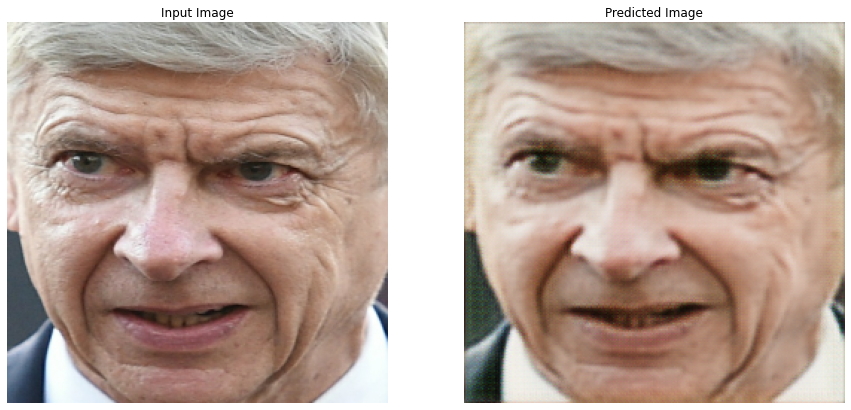

.....
Epoch:  5


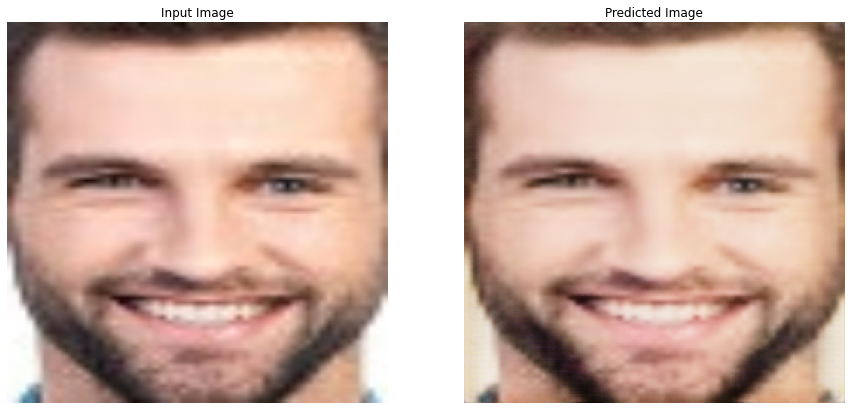

.....
Epoch:  10


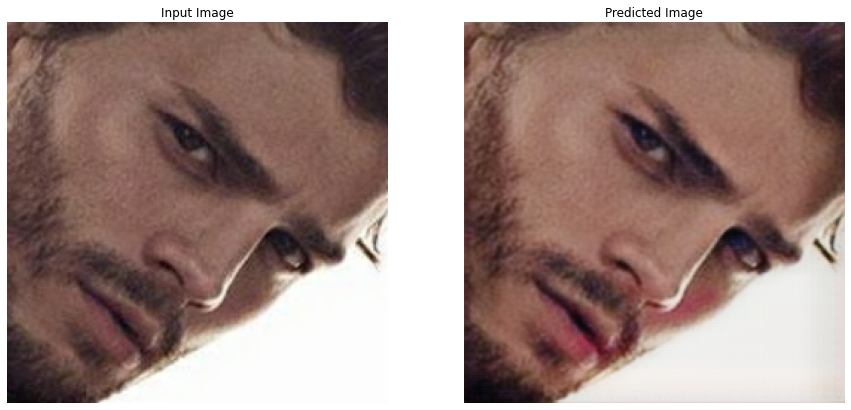

.....
Epoch:  15


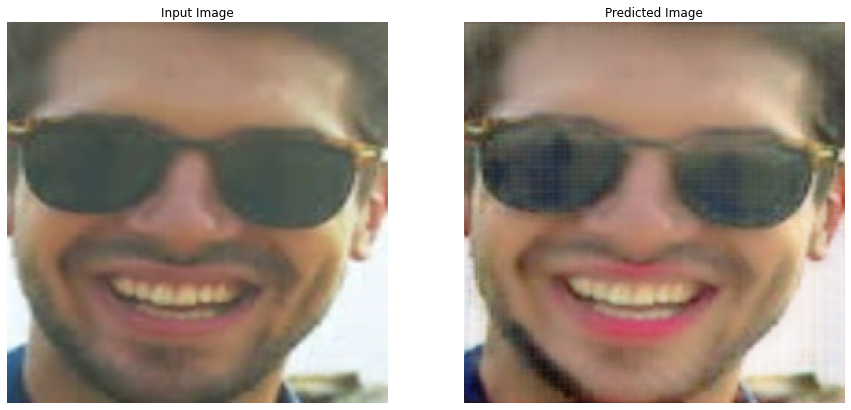

.....
Epoch:  20


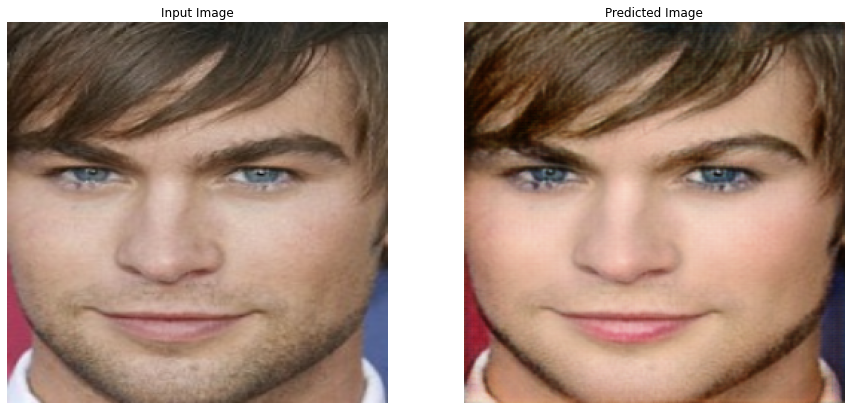

.....
Epoch:  25


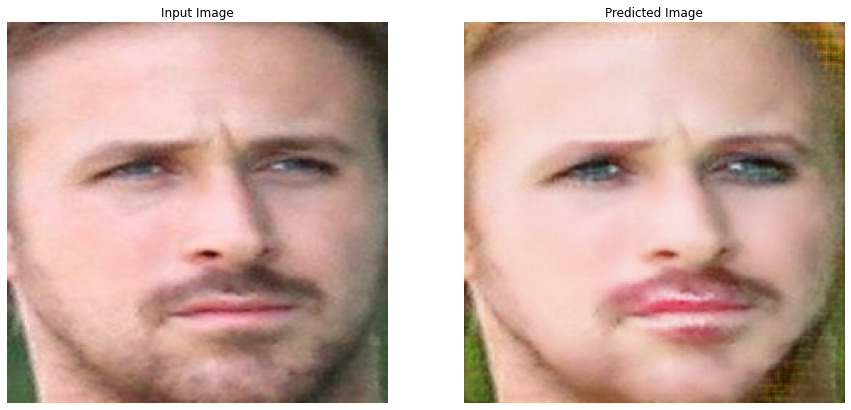

.....
Epoch:  30


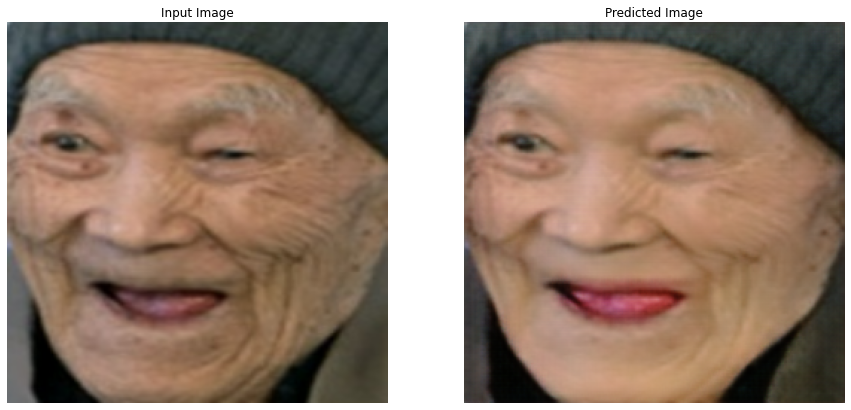

.....
Epoch:  35


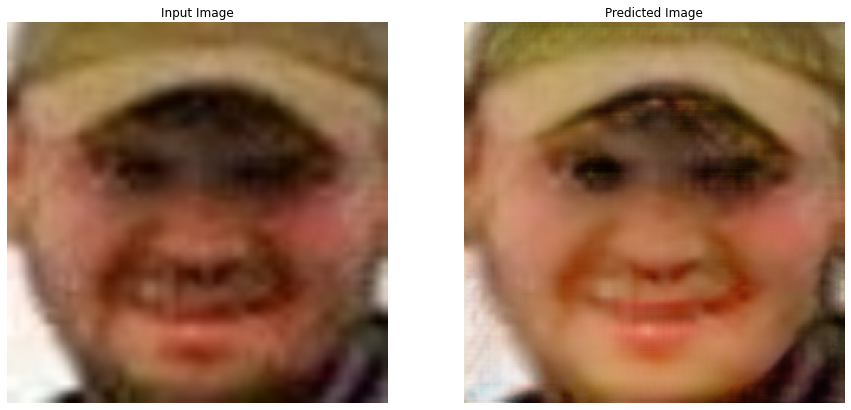

.....
Epoch:  40


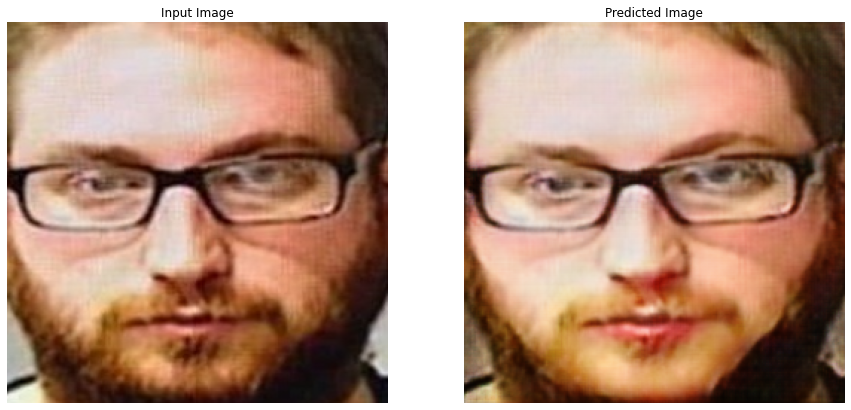

.....
Epoch:  45


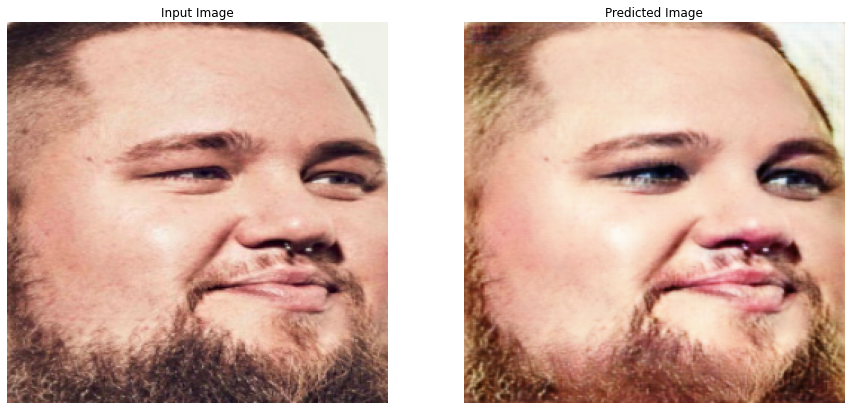

.....
Epoch:  50


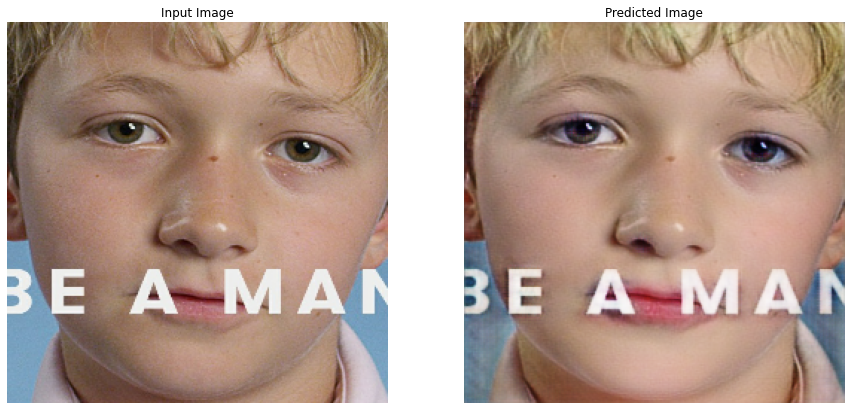

.....
Epoch:  55


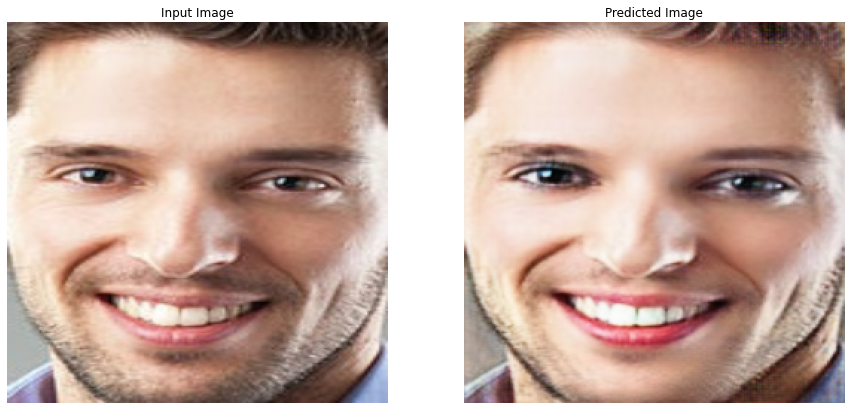

.....
Epoch:  60


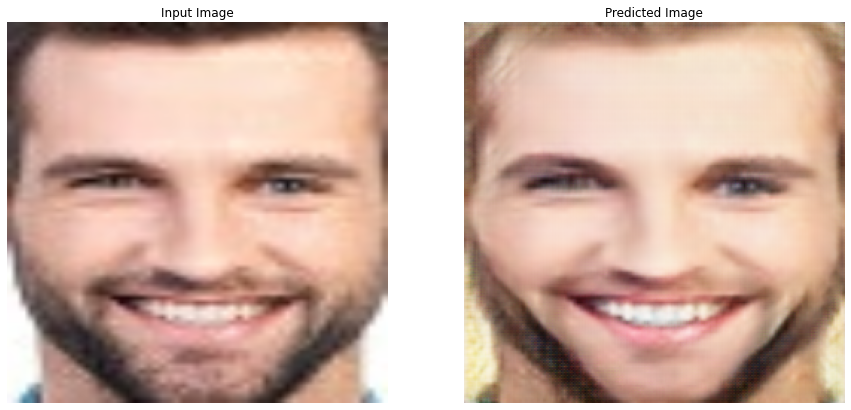

.....
Epoch:  65


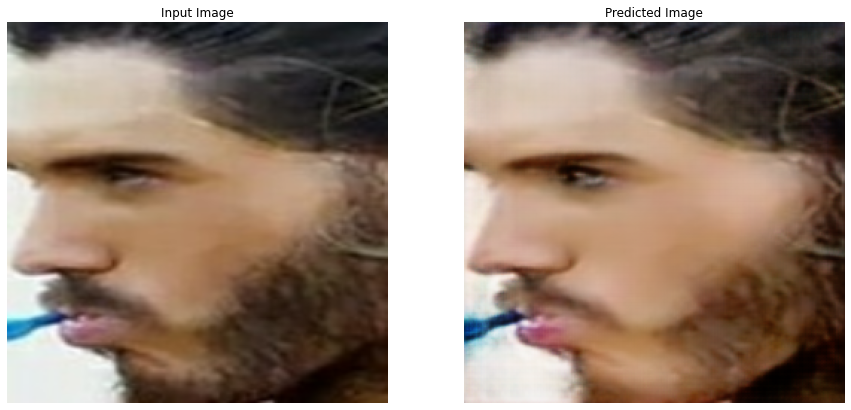

.....
Epoch:  70


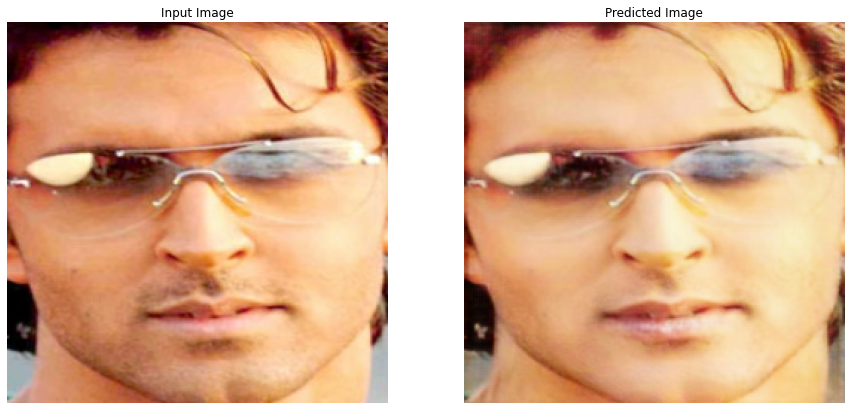

.....
Epoch:  75


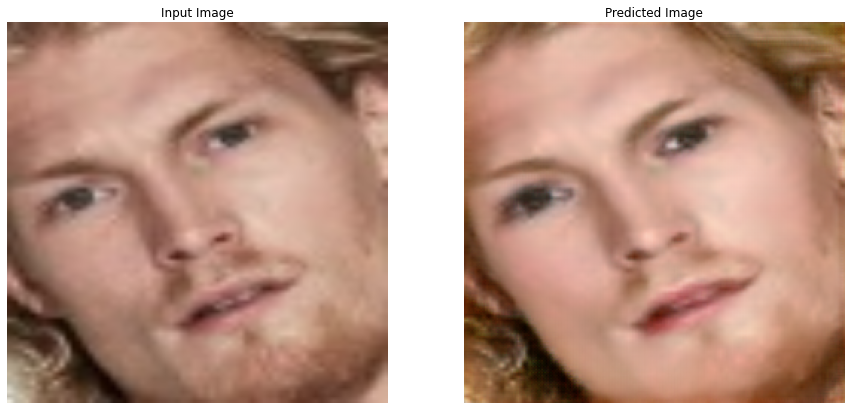

.....
Epoch:  80


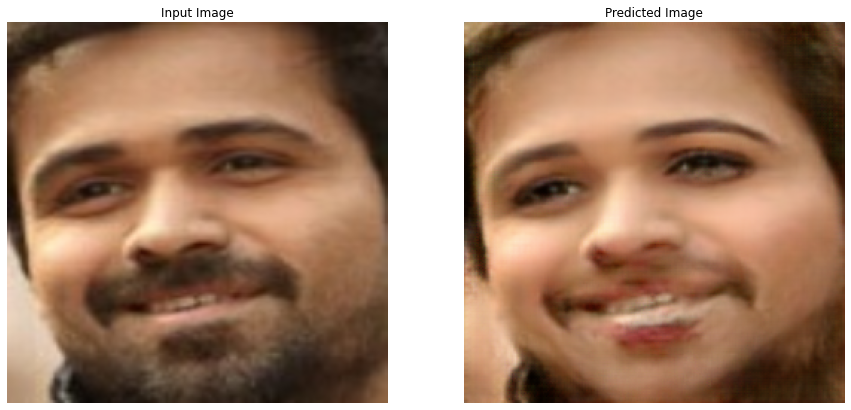

.....
Epoch:  85


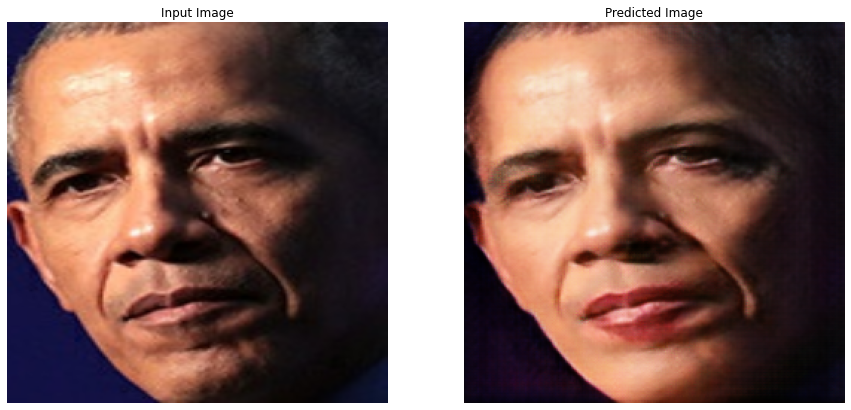

.....
Epoch:  90


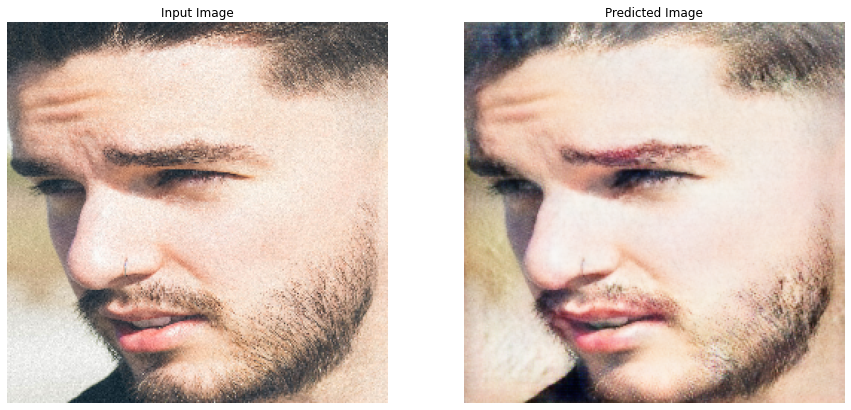

.....
Epoch:  95


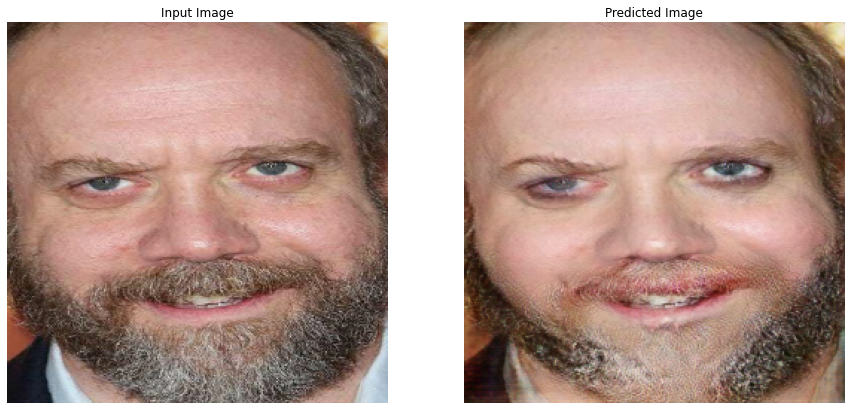

.....
Epoch:  100


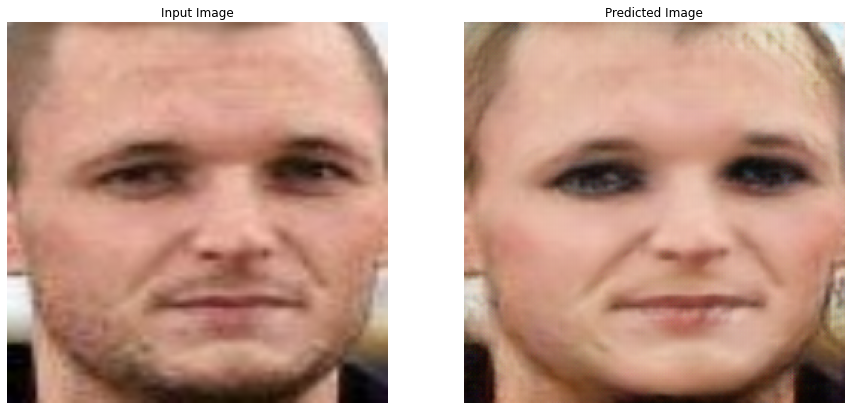

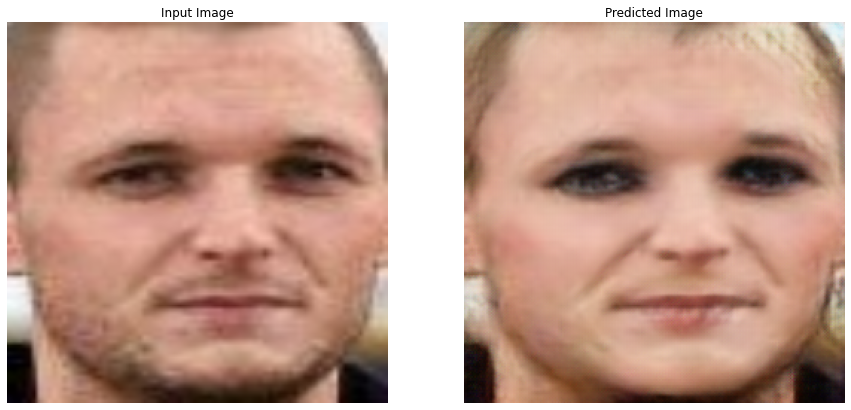

In [84]:
fit(data_train, data_test,  EPOCHS)

In [85]:
generator_x.save('man2woman.h5')
generator_y.save('woman2man.h5')
discriminator_x.save('discman.h5')
discriminator_y.save('discwoman.h5')

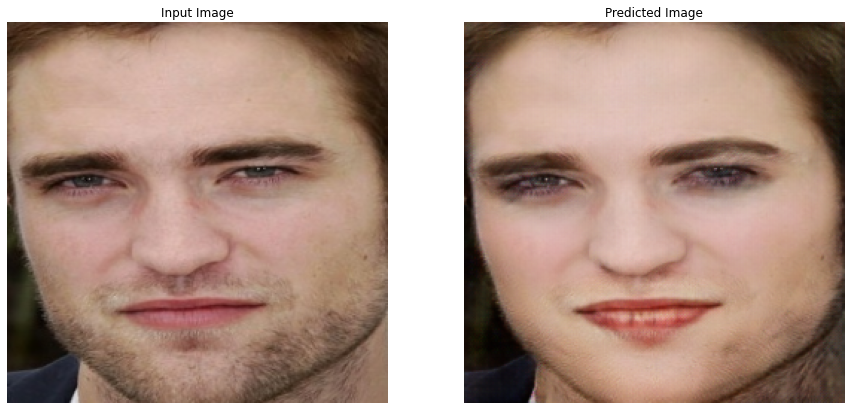

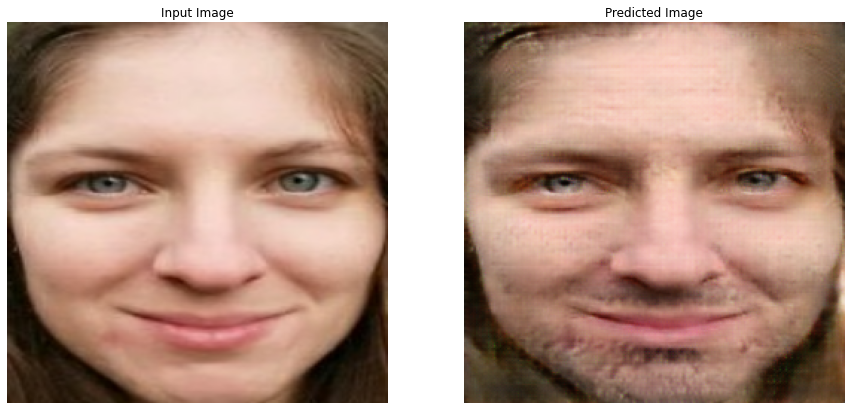

In [88]:
            for test_a, test_b in data_test.take(1):
                generate_images(generator_x, test_a)
                generate_images(generator_y, test_b)